kernel: scFates

In [1]:
%run /work/DevM_analysis/utils/colors.py

In [2]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.backends.backend_pdf as mpdf
from matplotlib.pyplot import rc_context

from anndata import AnnData
import scanpy as sc
import scFates as scf
import palantir
import pegasus as pg
import pegasusio as io

import warnings
from numba.core.errors import NumbaDeprecationWarning
warnings.filterwarnings(action='once')
warnings.simplefilter(action='once')
warnings.simplefilter(action="ignore", category=NumbaDeprecationWarning)
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=DeprecationWarning)

/work/home/software/anaconda3/envs/scFates/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from IPython.core.interactiveshell import InteractiveShell
#InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column', None) # display all the columns in pandas
pd.options.display.max_rows = 100

# Set up

In [5]:
new_anno = "anno_wnn_v51"
anno_hsc = 'anno_wnn_hsc'
cell = "Myelo"

In [6]:
adatas = {}
for pcw in range(5, 19):
    adata = sc.read_h5ad(f'data/{cell}_diffusion_PCW{pcw}.h5ad')
    adatas[pcw] = adata
adatas

{5: AnnData object with n_obs × n_vars = 5850 × 36601
     obs: 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'scDblFinder.score', 'libraryID', 'donorID', 'sampleID', 'Tissue', 'Sex', 'S.Score', 'G2M.Score', 'Phase', 'anno_wnn_v5', 'PCW', 'Batch', 'anno_wnn_v51', 'PCW250401', 'PCW241022', 'anno_wnn_hsc'
     var: 'highly_variable'
     uns: '_attr2type', 'anno_wnn_v51_colors', 'anno_wnn_v51_sizes', 'diffmap_evals', 'draw_graph', 'genome', 'log1p', 'modality', 'neighbors', 'paga', 'uid', 'umap'
     obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_draw_graph_fa_paga', 'X_fle', 'X_harmony', 'X_multiVI', 'X_palantir', 'X_pca', 'X_phi', 'X_umap', 'diffmap_knn_distances', 'diffmap_knn_indices', 'multiVI_knn_distances', 'multiVI_knn_indices'
     layers: 'counts'
     obsp: 'W_diffmap', 'W_multiVI', 'connectivities', 'distances',
 6: AnnData object with n_obs × n_vars = 4481 × 36601
     obs: 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rb', 'scDblFinder.score', 'libraryID', 'don

# MVI-palantir-PAGA

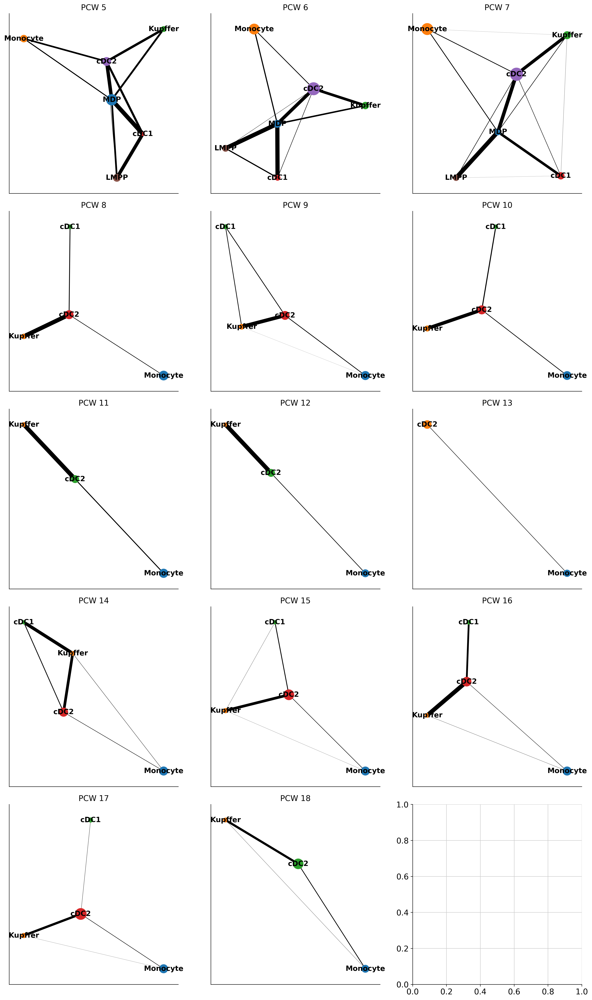

In [7]:
nrows, ncols = 5, 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 5))
for i, pcw in enumerate(range(5, 19)):
    i += 1
    sc.pl.paga(adatas[pcw], color=[new_anno], show=False, use_raw=False, ax=axes[int((i - 1) / ncols), (i - 1) % ncols], title=f"PCW {pcw}")
plt.tight_layout()

fig.savefig(f"plots/PAGA-Palantir-MVI.{cell}ByPCW.pdf")

plt.show()

# MVI-palantir-PAGA-FA

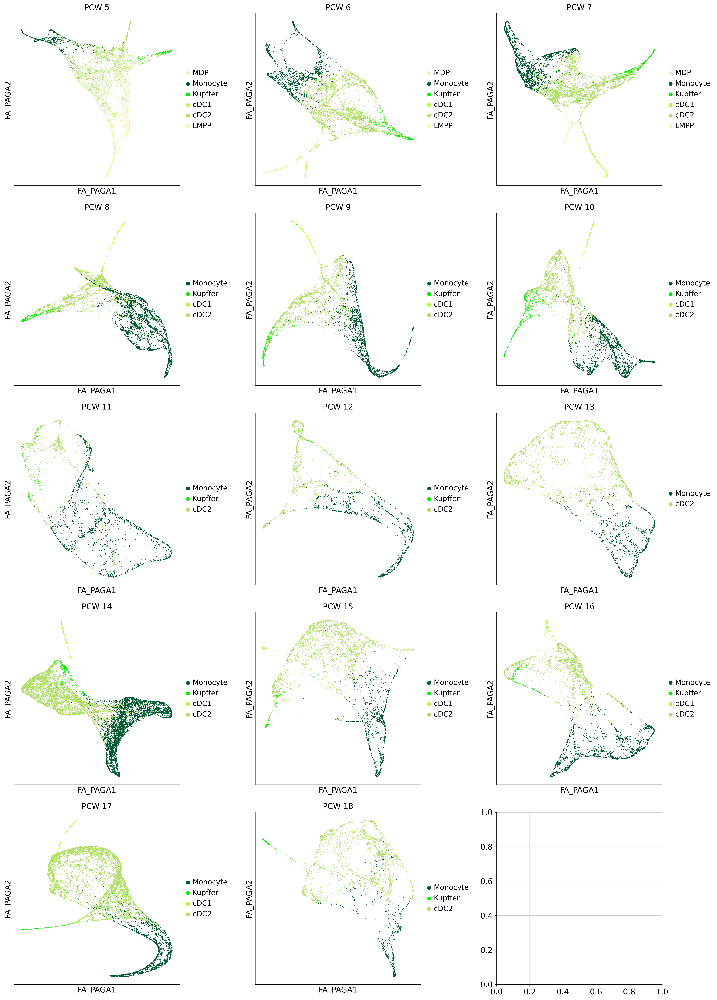

In [8]:
nrows, ncols = 5, 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 5))
for i, pcw in enumerate(range(5, 19)):
    i += 1
    sc.pl.embedding(adatas[pcw], basis='draw_graph_fa_paga', color=[new_anno], palette=annot2col,
               show=False, use_raw=False, ax=axes[int((i - 1) / ncols), (i - 1) % ncols],
               title=f"PCW {pcw}", ncols=ncols, size=10)
plt.tight_layout()

fig.savefig(f"plots/FA-PAGA-Palantir-MVI.{cell}ByPCW.pdf")

plt.show()

# MVI-Pegasus

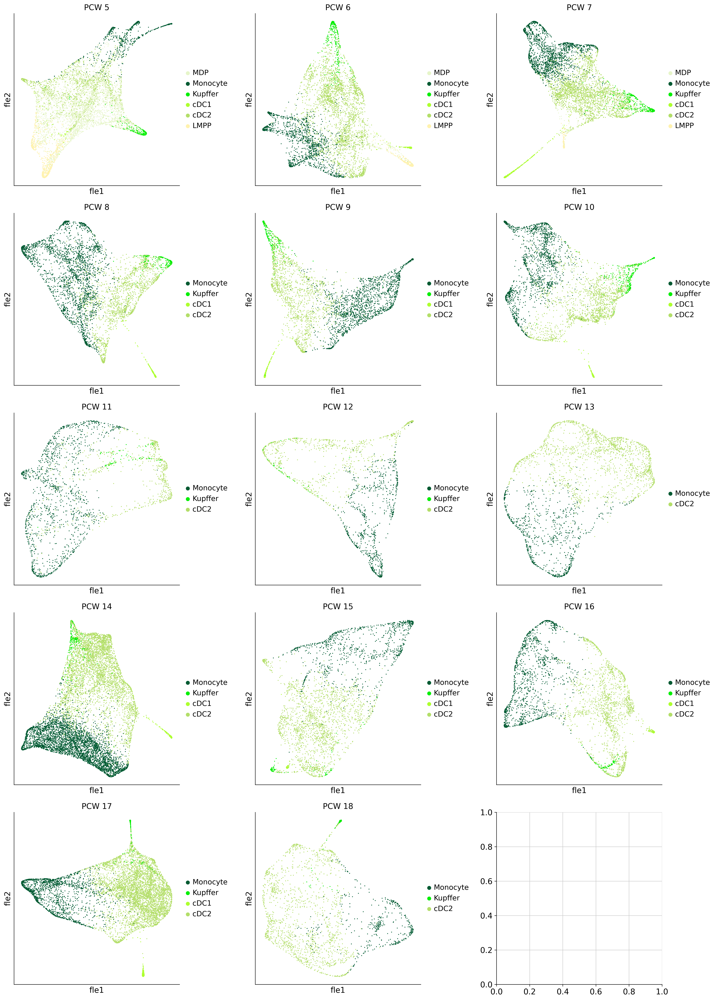

In [9]:
nrows, ncols = 5, 3
fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 6, nrows * 5))
for i, pcw in enumerate(range(5, 19)):
    i += 1
    sc.pl.embedding(adatas[pcw], basis='fle', color=[new_anno], palette=annot2col,
               show=False, use_raw=False, ax=axes[int((i - 1) / ncols), (i - 1) % ncols],
               title=f"PCW {pcw}", ncols=ncols, size=10)
plt.tight_layout()

fig.savefig(f"plots/FLE-Pegasus-MVI.{cell}ByPCW.pdf")

plt.show()